In [1]:

import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from numba import njit
import seaborn as sns
from scipy.ndimage.filters import gaussian_filter
import math
from matplotlib.colors import LogNorm
%matplotlib inline

/tmp/ipykernel_30755/3305087911.py:6: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter


In [2]:
@njit(fastmath=True)
def laplacian(Z, dt,dx):
    Ztop = Z[0:-2, 1:-1]
    Zleft = Z[1:-1, 0:-2]
    Zbottom = Z[2:, 1:-1]
    Zright = Z[1:-1, 2:]
    Zcenter = Z[1:-1, 1:-1]
    return (dt ) * (Ztop + Zleft + Zbottom + Zright -
            4 * Zcenter) / dx / dx 

In [3]:
@njit(fastmath=True)
def iter(U,V, Du, Dv, p, q, dt, dx):
    deltaU = laplacian(U, dt, dx)
    deltaV = laplacian(V, dt, dx)
    # We take the values of u and v inside the grid.
    Uc = U[1:-1, 1:-1]      
    Vc = V[1:-1, 1:-1]
    # We update the variables.
    U[1:-1, 1:-1], V[1:-1, 1:-1] = \
          Uc + Du * deltaU + dt * (1 - Uc*Vc), \
          Vc + Dv * deltaV + dt * (p*Vc*(Uc - (1+q)/(q+Vc)))
    # Neumann conditions: derivatives at the edges
    # are null.
    for Z in (U, V):
        Z[0, :] = Z[1, :]
        Z[-1, :] = Z[-2, :]
        Z[:, 0] = Z[:, 1]
        Z[:, -1] = Z[:, -2]
    return U, V

def calc_process(step_plot, U, V, du, dv, p, q, dt,dx,size, eps=1e-5, ):
    print(f'dx {dx} >=  (dt*2*max(du,dv))**0.5 { (dt*2*max(du,dv))**0.5} ')
    print(f'Du  = {du} >= {(q+1)/p*dv*(q**0.5 + (q+1)**0.5)**2}')
    assert dx >= (dt*2*max(du,dv))**0.5
    print(f'{U.max()} {U.min()} {V.max()} {V.min()}, {du}, {dv}')
    should_continue = True
    i = 0
    U_old = None
    U_oldest = None
    x_linspace = np.linspace(0, int(round(size*dx)), size)
    bar = tqdm()
    while should_continue:
        bar.update()
        labels = [f'${x:.1f}$' for x in x_linspace]
        if i % step_plot == 0:
            fig, axes = plt.subplots(1,3,figsize=(24,6))
            U_old = U.copy()
            U, V = iter(U, V, du, dv, p, q, dt, dx)
            diff = (U - U_old)
            abs_diff = np.abs(diff)
            delta = np.linalg.norm(diff)
            print(f'delta {delta}, q95 {np.quantile(abs_diff, 0.95)}, q99 {np.quantile(abs_diff, 0.99)} mean {np.mean(abs_diff)}')
            if delta < eps:
                should_continue = False
            ax = axes[1]
            sns.heatmap(np.abs(U - U_old), norm=LogNorm(), cmap='jet', ax = ax)
            ax.set_xticks(range(size))
            ax.set_xticklabels(labels)
            ax.set_yticks(range(size))
            ax.set_yticklabels(labels[::-1])
            ax.tick_params(axis=u'both', which=u'both',length=0)
            ax.set_title(f'Дельта для $\Delta t =$ {dt}')  

                    
            print(f'{U.max()} {U.min()} {V.max()} {V.min()}')
            
            
            ax = axes[0]
            sns.heatmap(U, cmap='jet', ax = ax)
            ax.set_title(f'Состояние на t={dt*i}')  
            ax.set_xticks(range(size))
            ax.set_xticklabels(labels)
            ax.set_yticks(range(size))
            ax.set_yticklabels(labels[::-1])
            ax.tick_params(axis=u'both', which=u'both',length=0)

            if U_oldest is None:
                U_oldest = U.copy()
            else:
                big_delta = U_oldest - U
                ax = axes[2]
                ax.set_title(f'Дельта для $\Delta t =$ {dt*step_plot}')  
                U_oldest = U.copy()
                sns.heatmap(np.abs(big_delta), norm=LogNorm(), cmap='jet', ax = ax)
                ax.set_xticks(range(size))
                ax.set_xticklabels(labels)
                ax.set_yticks(range(size))
                ax.set_yticklabels(labels[::-1])
                ax.tick_params(axis=u'both', which=u'both',length=0)


            fig.suptitle(f't = {i*dt}')
            for ax in axes:
                for axis in (ax.xaxis, ax.yaxis):
                    for index, tick in enumerate(axis.get_ticklabels()):
                        if index % 5:
                            tick.set_visible(False)
                for axis in (ax.xaxis, ax.yaxis):
                    for index, tick in enumerate(axis.get_ticklabels()):
                        if index % 5:
                            tick.set_visible(False)

            plt.show()
        else:
            U, V = iter(U, V, du, dv, p, q, dt, dx)
        i+=1

In [4]:
size = 201  # size of the 2D grid
dx = 0.1  # space step
T = 1000.0  # total time
dt = .01  # time step
n = int(T / dt)  
p = 1
q = 1

In [5]:
Dv=0.0001

In [6]:
Du = 0.005

In [7]:
dt = 0.01
(dt*max(Du, Dv))**0.5

0.007071067811865475

dx 0.01 >=  (dt*2*max(du,dv))**0.5 0.005477225575051661 
Du  = 0.0015 >= 0.001165685424949238
1.0999951275272308 1.0000010568963318 1.0999973136378458 1.0000048598581543, 0.0015, 0.0001


0it [00:00, ?it/s]

delta 3.9854079303147434, q95 0.035955453247268565, q99 0.04361301448945576 mean 0.0166131232472764
1.0943941891803741 1.0030069169491194 1.1003960650262907 1.0009572249197058


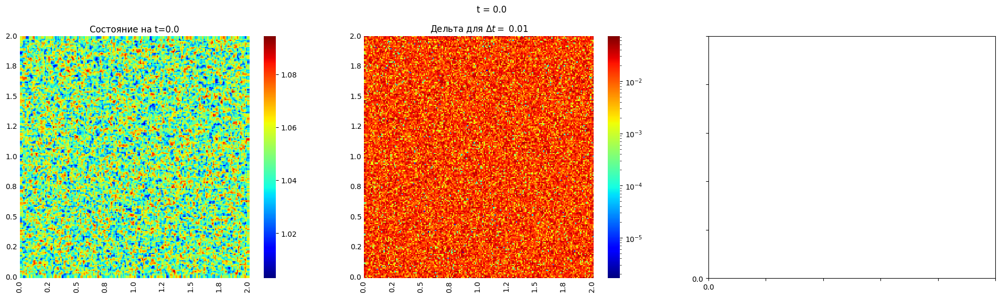

19783it [00:09, 2777.65it/s]

delta 0.0012306359414725478, q95 1.2708020989182778e-05, q99 1.928979083032356e-05 mean 4.439309866139794e-06
1.2370189832701761 0.6082749553221923 2.7578864804186063 0.23433536882989695


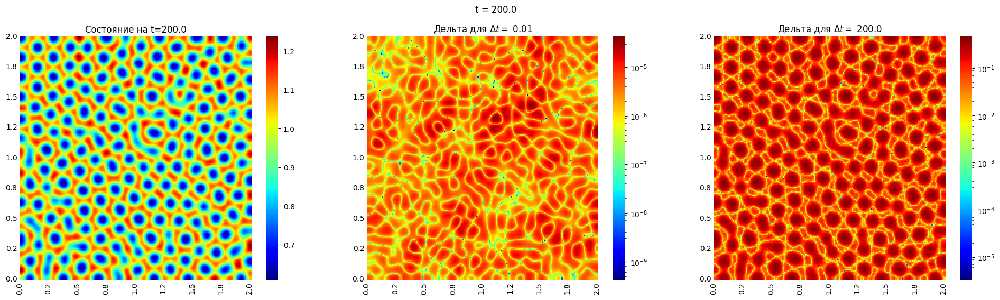

39988it [00:19, 2820.05it/s]

delta 0.00041622890784386496, q95 4.392066688785334e-06, q99 7.715238379724099e-06 mean 1.3476126464237472e-06
1.2377969421493902 0.6048669429451099 2.770283984612249 0.23266088373860866


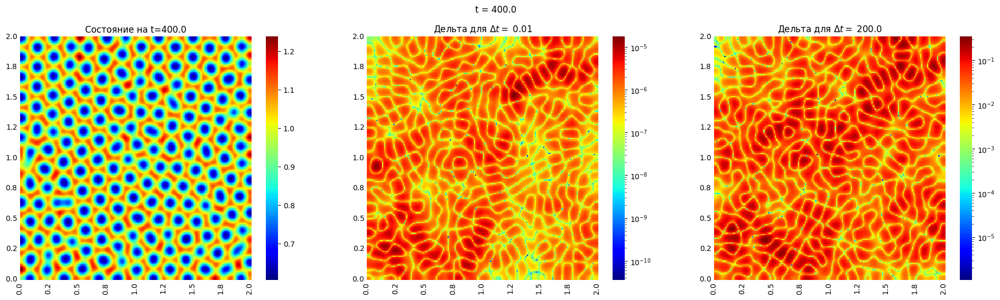

59937it [00:28, 2856.53it/s]

delta 0.00026765609752973815, q95 2.4142772920843214e-06, q99 5.1144447817952354e-06 mean 7.888466422643771e-07
1.2408973849044096 0.6044483168934717 2.774510928460093 0.23364306684758673


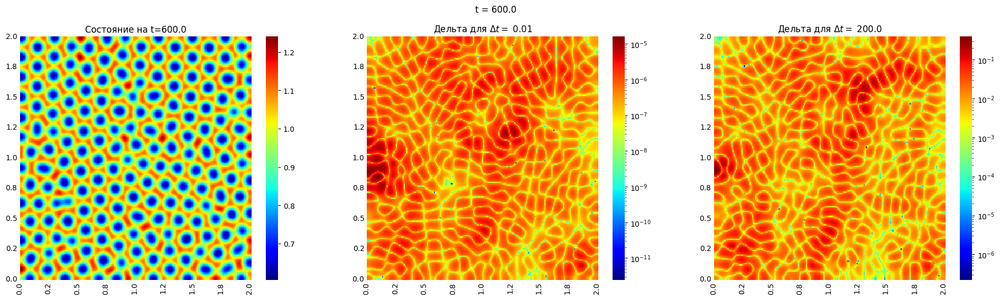

79932it [00:38, 2838.93it/s]

delta 0.0002006538254614882, q95 2.075281662961004e-06, q99 3.711309036535937e-06 mean 6.500165921309539e-07
1.241494656770446 0.6040106601327171 2.7629175339983356 0.245811751862887


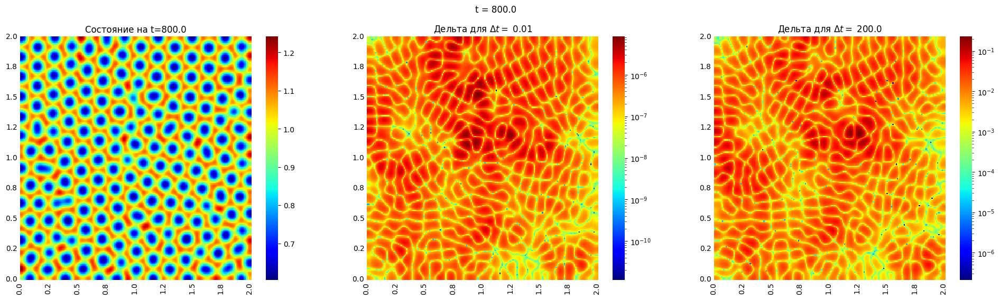

99880it [00:48, 2841.08it/s]

delta 0.0002847145588528884, q95 2.565081010263981e-06, q99 6.408943928670752e-06 mean 7.207144272074137e-07
1.24145474840264 0.6039246540180542 2.765537430118269 0.24752258109733877


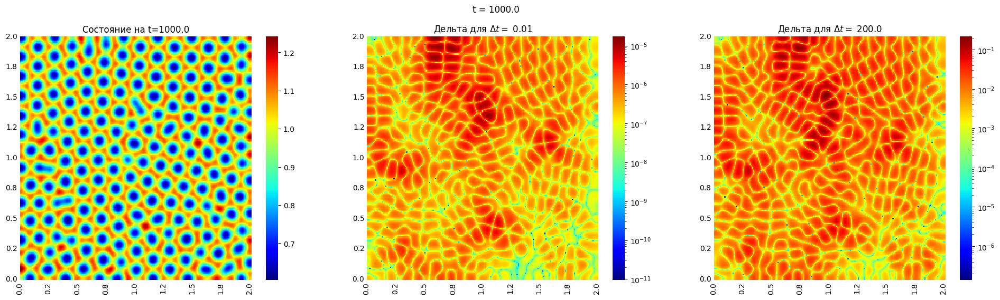

119950it [00:57, 2782.64it/s]

delta 0.00022083590239022427, q95 2.4492598554859413e-06, q99 4.2330389808942215e-06 mean 6.678640724658078e-07
1.2407185843872361 0.6040685401480048 2.7738530338341794 0.24823107441922232


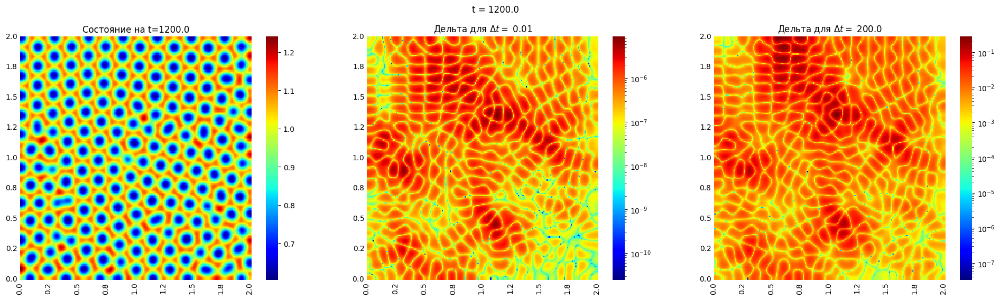

139802it [01:08, 2692.50it/s]

delta 0.00015808564965686344, q95 1.610769205573348e-06, q99 3.0272897699745727e-06 mean 4.546498064109516e-07
1.2382833842553898 0.6044845105017697 2.7807979141231125 0.24276427967633932


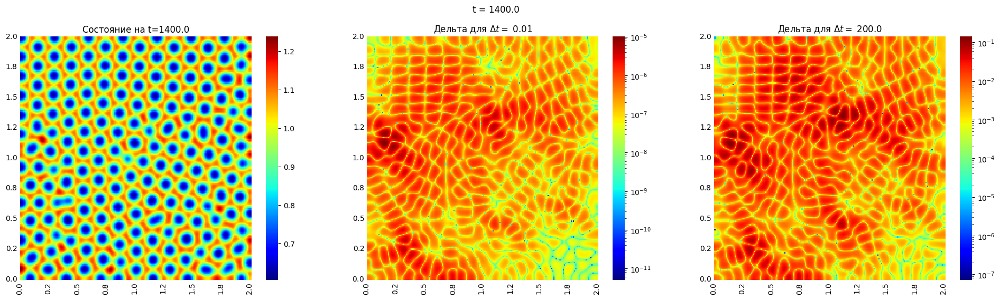

159887it [01:18, 2782.94it/s]

delta 9.681724964481387e-05, q95 1.054938865374666e-06, q99 1.7571650426928542e-06 mean 3.07382997723886e-07
1.2340683422823684 0.6047487761137881 2.7800940528102345 0.23748796631638366


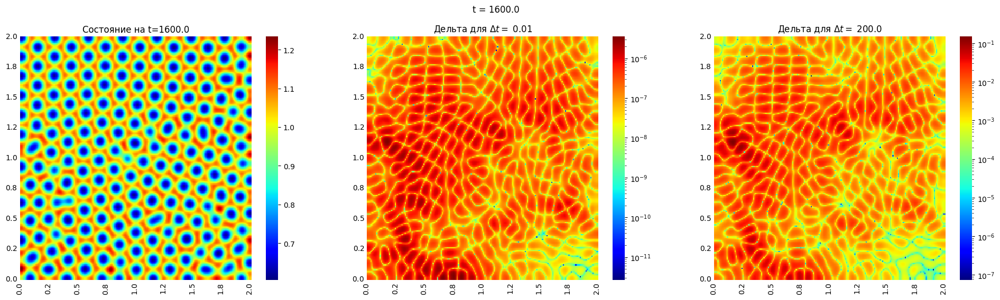

In [64]:
calc_process(20000,
            U = np.random.rand(size, size)*0.1 + 1 ,
            V = np.random.rand(size, size)*0.1 + 1 ,
            du= 0.0015,
            dv=0.0001,
            p=1,
            q=1,
            dt = .01,
            dx=0.01,
            size=201,
            eps=1e-4)

dx 0.01 >=  (dt*2*max(du,dv))**0.5 0.00447213595499958 
Du  = 0.01 >= 0.001165685424949238
1.0999988553239606 1.0000002029064239 1.099999678701086 1.0000001114436887, 0.01, 0.0001


0it [00:00, ?it/s]

delta 6.6052825139567695, q95 0.02374574114935668, q99 0.028997454894156505 mean 0.010963282326183271
1.0960834760266904 1.0024057447110348 1.1000863995037415 1.0001028367495886


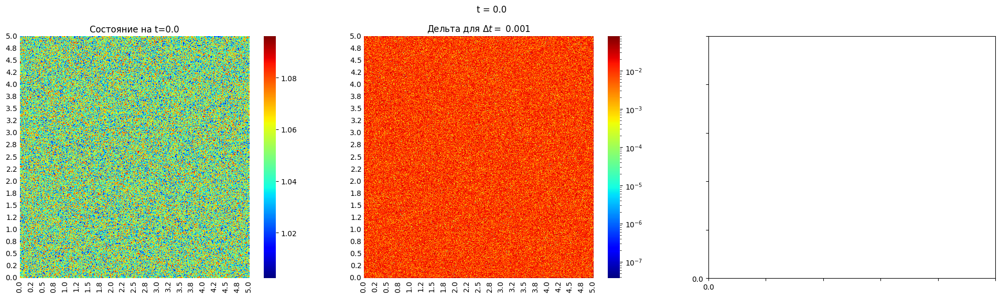

49952it [01:40, 520.42it/s]

delta 0.0014057057103595528, q95 5.536421523233415e-06, q99 1.0868727165880276e-05 mean 1.7492979210440257e-06
0.8608466607327204 0.15277940133483894 14.175819628515953 0.00032275988503739113


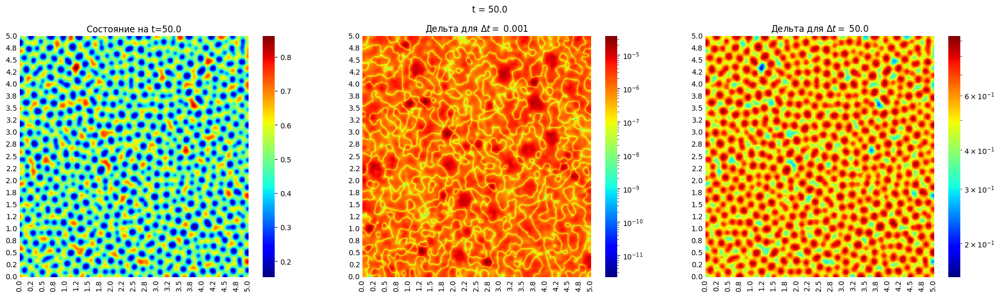

99955it [03:23, 508.84it/s]

delta 0.0004739336913266495, q95 1.6978493894148627e-06, q99 3.389439948597861e-06 mean 5.742512163057777e-07
0.7836413187374472 0.16768873802421957 13.69503695142685 0.00045909647338740803


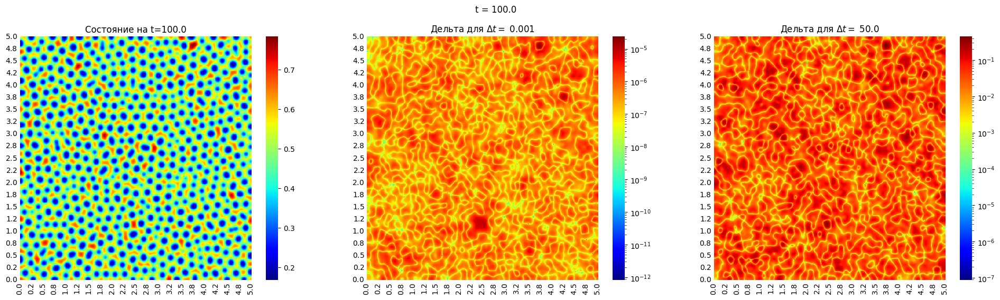

150001it [05:06, 529.17it/s]

delta 0.00048547697902587793, q95 1.143876721898529e-06, q99 3.30498673761781e-06 mean 4.137122290623784e-07
0.7630097666066293 0.1716603990099737 13.780160372832574 0.00031679973994745486


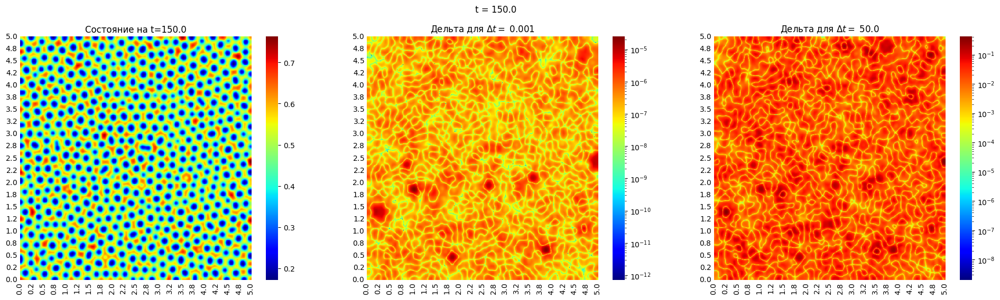

199953it [06:49, 505.64it/s]

delta 0.00020434474606504646, q95 7.2439634057897e-07, q99 1.316519999128296e-06 mean 2.5183235919254486e-07
0.7467699277270167 0.17174042272876067 13.714973049145708 0.0003372896624334134


Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7fec5c106ec0>>
Traceback (most recent call last):
  File "/home/alexander/Desktop/univer/higgins2d/.venv/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


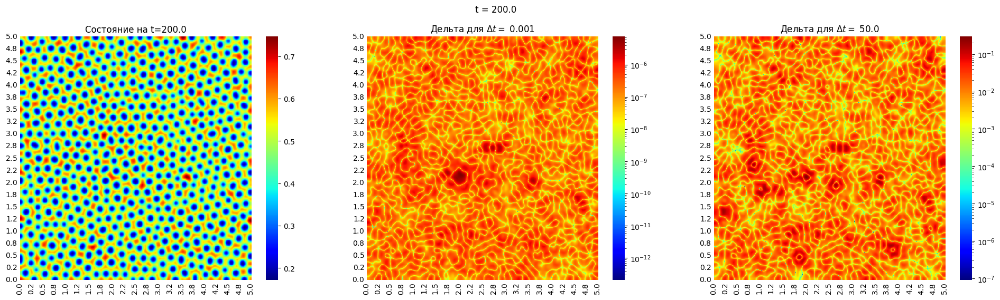

205573it [07:07, 503.81it/s]

SystemError: CPUDispatcher(<function iter at 0x7feb7ac8ce50>) returned a result with an exception set

In [66]:
size = 501
calc_process(50000,
            U = np.random.rand(size, size)*0.1 + 1 ,
            V = np.random.rand(size, size)*0.1 + 1 ,
            du= 0.01,
            dv=0.0001,
            p=1,
            q=1,
            dt = .001,
            dx=0.01,
            size=size,
            eps=1e-4)

In [ ]:
size = 501
calc_process(50000,
            U = np.random.rand(size, size)*0.1 + 1 ,
            V = np.random.rand(size, size)*0.1 + 1 ,
            du= 0.1,
            dv=0.0001,
            p=1,
            q=1,
            dt = .001,
            dx=0.01,
            size=size,
            eps=1e-4)

dx 0.01 >=  (dt*2*max(du,dv))**0.5 0.00447213595499958 
Du  = 0.01 >= 0.013172670690061993
1.0999997175361076 1.0000003190910476 1.0999996842172257 1.0000001930555338, 0.01, 0.0001


0it [00:00, ?it/s]

delta 6.607047795485494, q95 0.023698218736720955, q99 0.028924734955132037 mean 0.010972689669571883
1.097920843244944 1.0027658494398453 1.1000644607837178 1.0000910425871135


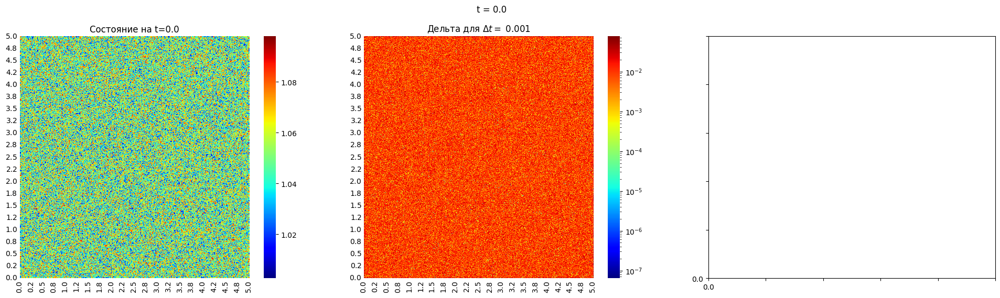

9950it [00:23, 520.67it/s]

delta 0.00019582060720715587, q95 4.182997239698949e-07, q99 4.3035850172401524e-07 mean 3.9049120637371616e-07
0.9993558514707949 0.9973450954615306 1.0122035992846423 0.9914123385049145


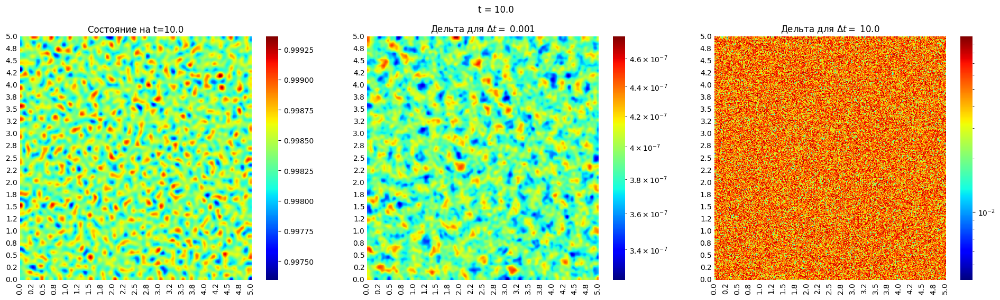

15716it [00:40, 505.60it/s]

In [8]:
size = 501
calc_process(10000,
            U = np.random.rand(size, size)*0.1 + 1 ,
            V = np.random.rand(size, size)*0.1 + 1 ,
            du= 0.01,
            dv=0.0001,
            p=1,
            q=5,
            dt = .001,
            dx=0.01,
            size=size,
            eps=1e-4)